In [ ]:
# images treatment
from skimage import io, color
from skimage import filters, morphology, segmentation, feature
from skimage import metrics
from skimage import transform
from skimage.metrics import mean_squared_error as mse, structural_similarity as ssim
from skimage import exposure, img_as_float, img_as_uint, img_as_ubyte
from scipy import ndimage as ndi
# images performances
from sklearn.metrics import confusion_matrix
from skimage.measure import shannon_entropy
from skimage.feature import greycomatrix, greycoprops
from skimage import data

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import time

# Brain Tumor Detection using Image Processing

An approach through Anisotropic Diffusion, Top-hat Filtering, Histogram Equalization and Watershed Segmentation

#### Display

In [ ]:
class MediaPlayer:

    @staticmethod
    def display_images(images, titles=None, x_labels=None, suptitle=None, cmaps=None):
        """
        Displays a sequence of images with optional titles and X-axis labels.

        :param images: List of images to display.
        :param titles: List of titles for each image. If None, no titles are displayed.
        :param x_labels: List of X-axis labels for each image. If None, no labels are displayed.
        :param cmaps: List of colormaps to use for displaying each image.
                       If None, 'gray' is used for all images.
        """
        num_images = len(images)
        if titles is None:
            titles = [''] * num_images  # Create an empty list of titles if none are provided
        if x_labels is None:
            x_labels = [''] * num_images  # Create an empty list of X-axis labels if none are provided
        if cmaps is None:
            cmaps = ['gray'] * num_images  # Use 'gray' for all images if no list is provided

        assert len(titles) == num_images, "The number of images must match the number of titles."
        assert len(x_labels) == num_images, "The number of images must match the number of X-axis labels."
        assert len(cmaps) == num_images, "The number of images must match the number of colormaps."

        plt.figure(figsize=(num_images * 4, 4))  # Adjust the figure size based on the number of images
        plt.suptitle(suptitle, fontsize=20, y=1.05)
        for i, (image, title, x_label, cmap) in enumerate(zip(images, titles, x_labels, cmaps)):
            ax = plt.subplot(1, num_images, i + 1)
            plt.imshow(image, cmap=cmap) if cmap != '' else plt.imshow(image, cmap='gray')
            plt.title(title)
            ax.set_xlabel(x_label)  # Set the X-axis label
            # plt.axis('off')
        plt.tight_layout()
        plt.show()

    @staticmethod
    def display_histograms(images, titles=None, bins=256, color='black', suptitle=None):
        """
        Displays histograms of provided images.

        :param images: List of images for which to display histograms.
        :param titles: List of titles for each histogram. If None, no titles are displayed.
        :param bins: Number of bins to distribute pixel values into for the histogram.
        :param color: Color of the histogram bars.
        :param suptitle: Overall title for the figure containing all histograms.
        """
        num_images = len(images)
        if titles is None:
            titles = [''] * num_images  # Create an empty list of titles if none are provided

        assert len(titles) == num_images, "The number of images must match the number of titles."

        plt.figure(figsize=(num_images * 4, 4))  # Adjust the figure size based on the number of histograms
        plt.suptitle(suptitle, fontsize=16)
        for i, (image, title) in enumerate(zip(images, titles)):
            ax = plt.subplot(1, num_images, i + 1)
            if image.ndim == 2:  # Grayscale image
                plt.hist(image.ravel(), bins=bins, color=color, alpha=0.75)
            else:  # Color image, display histograms for each channel
                for j, color in enumerate(['red', 'green', 'blue']):
                    plt.hist(image[:, :, j].ravel(), bins=bins, color=color, alpha=0.75, label=f'{color} channel')
                plt.legend()
            plt.title(title)
            plt.xlabel('Pixel Intensity')
            plt.ylabel('Number of Pixels')
        plt.tight_layout()
        plt.show()

In [ ]:
def resize_image(image, new_height, new_width):
    # Redimensionner l'image
    resized_image = transform.resize(image, (new_height, new_width))
    return resized_image

def normalize_image(image):
    # Convertir l'image en flottants pour éviter la perte de précision
    image = image.astype(np.float32)

    # Trouver la valeur minimale de l'image
    min_value = np.min(image)

    # Calculer la plage dynamique de l'image (la différence entre la valeur minimale et maximale)
    dynamic_range = np.max(image) - min_value

    # Normaliser l'image en soustrayant la valeur minimale et en divisant par la plage dynamique
    normalized_image = (image - min_value) / dynamic_range

    return normalized_image

## 1.  Data acquisition

Loading fixed images A, B, C, D, E, F, G et H

In [ ]:
# Chemin du dossier contenant les images
folder_path = '/content/drive/MyDrive/Colab Notebooks/vti/brain_tumor_dataset/yes' #no

# Noms des fichiers images (remplacer par les noms de fichiers réels)
image_files = ['Y30.jpg', 'Y51.jpg', 'Y81.jpg', 'Y13.jpg', 'Y53.jpg', 'Y1.jpg', 'Y4.jpg', 'Y6.jpg']
# os.path.join(folder_path, file_name)
# Chargement des images en niveau de gris
def read_image(image_path):
    image = io.imread(image_path)

    if len(image.shape) == 3 and image.shape[2] == 3:
        image = color.rgb2gray(image)

    image = resize_image(image, 256, 256)

    return img_as_ubyte(image)

# Chargement des images
# Convertir en niveau de gris seulement si l'image est en couleur
images = []
for file_name in image_files:
    img_path = os.path.join(folder_path, file_name)
    img = read_image(img_path)
    images.append(img)

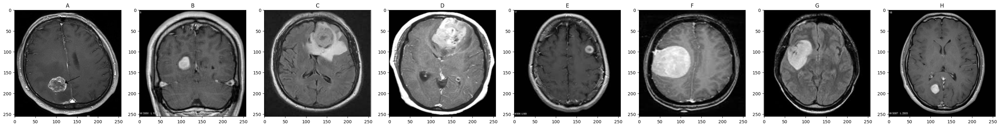

In [ ]:
MediaPlayer.display_images(images, ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H'])

## 2. Preprocessing

In [ ]:
image = images[0]

#### a. ADF filtering

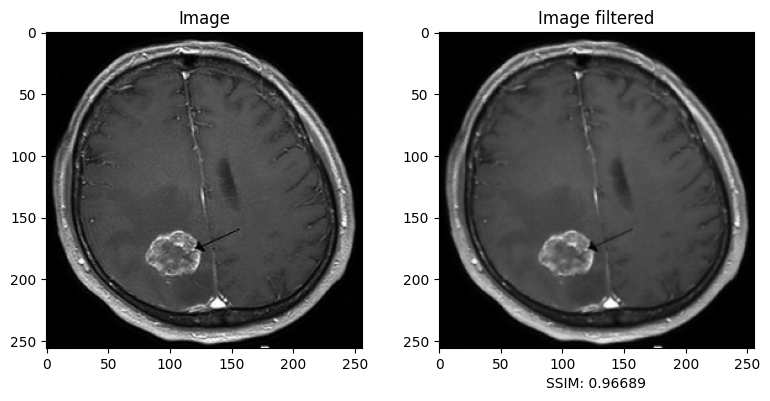

In [ ]:
from scipy.ndimage import convolve, gaussian_gradient_magnitude

# Fonction de l'arrêt des bords
def edge_stop_function(gradient, beta):
    return 1.0 / (1.0 + (gradient/beta)**2)

# Fonction d'itération de l'ADF
def anisotropic_diffusion_filter(image, alpha, beta, iterations):
    image = img_as_float(image.copy())
    for _ in range(iterations):
        # Calcul du gradient de l'image
        gradient_magnitude = gaussian_gradient_magnitude(image, sigma=1)

        # Calcul de la fonction d'arrêt des bords
        c = edge_stop_function(gradient_magnitude, beta)

        # Calcul des différences entre pixels adjacents
        diff_north = convolve(image, np.array([[0, 1, 0], [0, -1, 0], [0, 0, 0]]))
        diff_south = convolve(image, np.array([[0, 0, 0], [0, -1, 0], [0, 1, 0]]))
        diff_east = convolve(image, np.array([[0, 0, 0], [0, -1, 1], [0, 0, 0]]))
        diff_west = convolve(image, np.array([[0, 0, 0], [1, -1, 0], [0, 0, 0]]))

        # Mise à jour des intensités des pixels
        image += alpha * (c * diff_north + c * diff_south + c * diff_east + c * diff_west)

    return img_as_ubyte(image)


# Paramètres pour l'ADF
alpha = 0.1  # Taux de diffusion
beta = 0.1  # Constante de lissage
iterations = 3  # Nombre d'itérations

# Application de l'ADF
image_filtered = anisotropic_diffusion_filter(image, alpha, beta, iterations)
score_value = ssim(image, image_filtered)
MediaPlayer.display_images([image, image_filtered], ["Image", "Image filtered"], ["", f'SSIM: {score_value:.5f}'])

#### b. Skull stripping

The uppermost layer of the brain is the skull, which contains the whole brain tissues and blood vessels inside it. Eliminating the scalp
layer is necessary for better visualization and analysis of scanned brain images. For this purpose, the grayscale image is converted into
binary form using thresholding. The histogram plot of input brain image is created to select a threshold value. For the image considered in
this paper, the threshold lies in the range of 20–80. From the binary image, image background is eliminated from the foreground. The
foreground is eroded to remove the skull tissue. Now the eroded foreground image used as a mask to grayscale brain image and skull free
image is extracted.


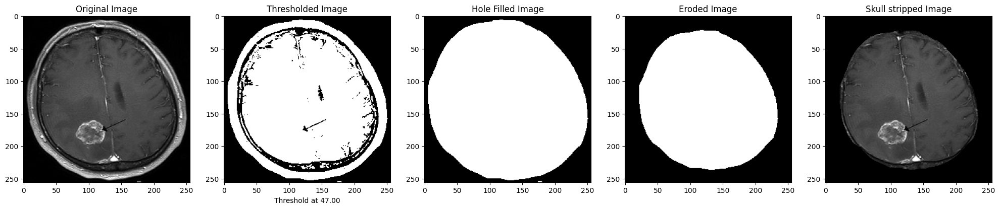

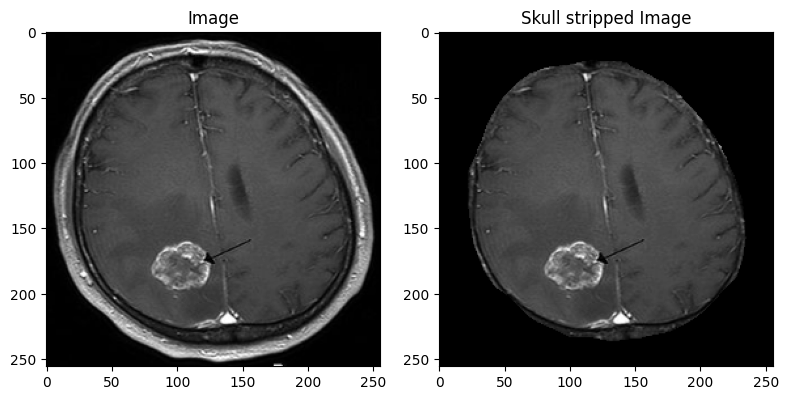

In [ ]:
def skull_stripping(image, se_closing, se_erosion, skull_remove_area=2000, show_pipeline=False):
    # Step 2: Create a histogram and use Otsu's method to find a threshold value
    threshold_value = filters.threshold_otsu(image)

    # Step 3: Threshold the image to convert it into binary form
    binary_image = image > threshold_value

    # Step 4: Hole filling using morphological operators
    filled_image = morphology.closing(binary_image, se_closing)
    filled_image = morphology.remove_small_holes(filled_image, area_threshold=skull_remove_area)

    # Step 5: Edge detection and erosion (assuming we want to erode the edges slightly)
    eroded_image = morphology.erosion(filled_image, se_erosion)

    # Step 6: Create a binary mask and apply it to get the skull-stripped image
    skull_stripped_image = np.where(eroded_image, image, 0)


    if show_pipeline:
        MediaPlayer.display_images(images=[image, binary_image, filled_image, eroded_image, skull_stripped_image],
                                   titles=['Original Image', 'Thresholded Image', 'Hole Filled Image', 'Eroded Image',"Skull stripped Image"],
                                    x_labels=["",f'Threshold at {threshold_value:.2f}', '', '', ''])

    return img_as_ubyte(skull_stripped_image)


# Application
skull_stripped_image = skull_stripping(image,
                                       se_closing=morphology.disk(2),
                                       skull_remove_area=2000,
                                       se_erosion=morphology.disk(16),
                                       show_pipeline=True)

score_value = ssim(image, skull_stripped_image)
MediaPlayer.display_images([image, skull_stripped_image], ["Image", "Skull stripped Image"], ["", ''])

The white top hat of an image is defined as the image minus its morphological opening. This operation returns the bright spots of the image that are smaller than the footprint.

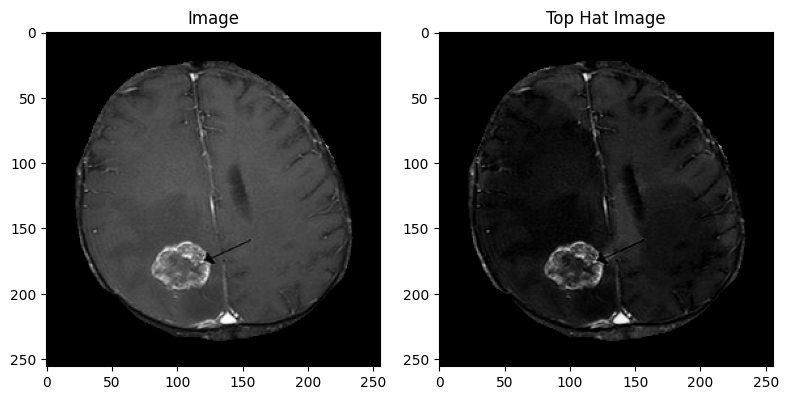

In [ ]:
tophat_image = morphology.white_tophat(skull_stripped_image, morphology.disk(25))
MediaPlayer.display_images([skull_stripped_image, tophat_image], ["Image", "Top Hat Image"])

#### c. Contrast enhancement

The enhancement of the image is done by applying the HE. HE technique enhances the visual contrast of an image by changing the image
intensity so that the histogram of the resulting image is approximately flat.

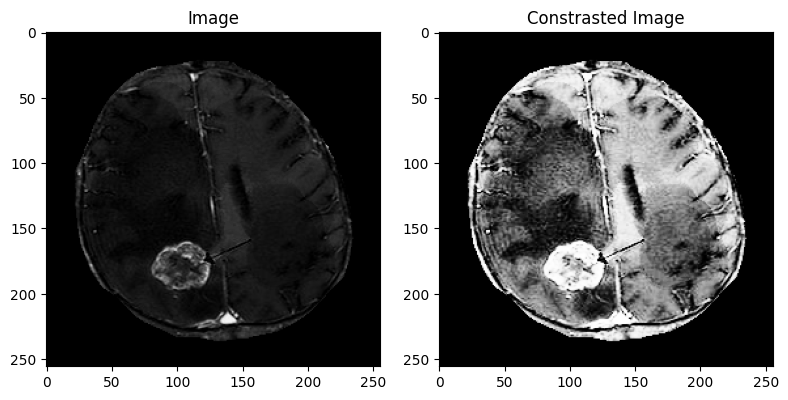

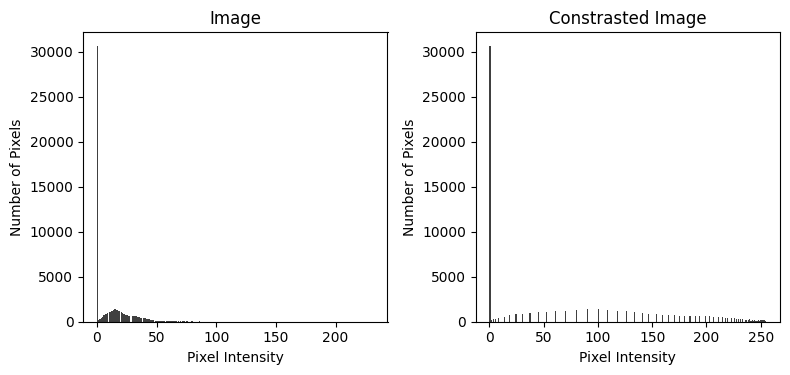

In [ ]:
def contrast_enhancement(image):
    contrasted_image = exposure.equalize_hist(image)
    contrasted_image = normalize_image(contrasted_image)
    return img_as_ubyte(contrasted_image)

# Application
contrasted_image = contrast_enhancement(tophat_image)

MediaPlayer.display_images([tophat_image, contrasted_image], ["Image", "Constrasted Image"])
MediaPlayer.display_histograms([tophat_image, contrasted_image], ["Image", "Constrasted Image"])

## 3. Segmentation

#### a.  Watershed segmentation

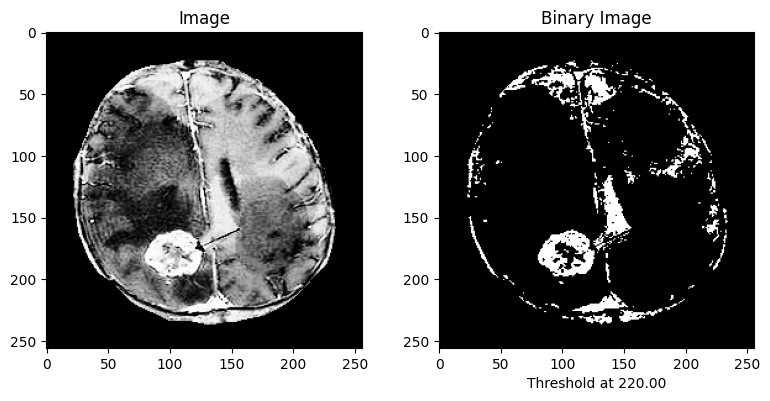

In [ ]:
def get_binary(image, thresh=None):
    if thresh is None:
        thresh = filters.threshold_otsu(image)
    binary_image = image > thresh
    return binary_image, thresh


binary_image, thresh = get_binary(contrasted_image, 220)
MediaPlayer.display_images([contrasted_image, binary_image], ["Image", "Binary Image"],['', f'Threshold at {thresh:.2f}'])

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


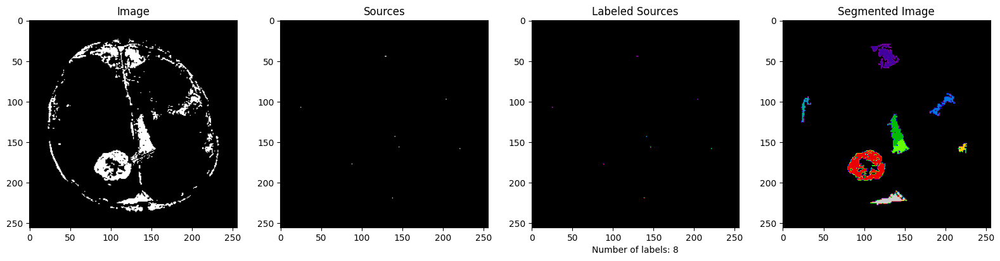

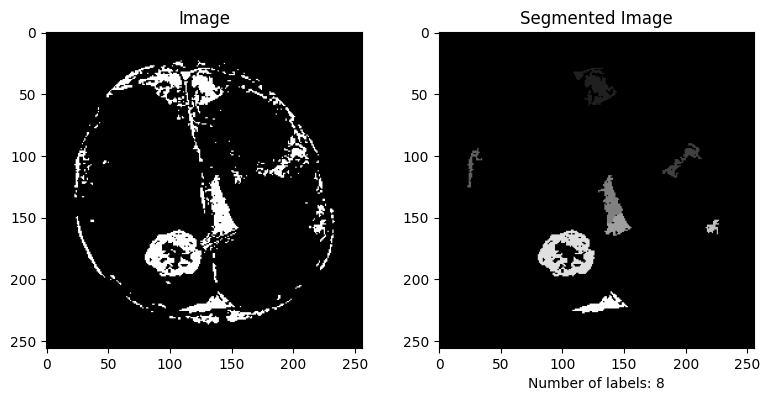

In [ ]:
def watershed_segmentation(image, se_peak_local=np.ones((3, 3)), show_pipeline=False):
    # Compute the distance map
    distance = ndi.distance_transform_edt(image)

    # Determine the local maxima of the distance map
    local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)

    # Mark the local maxima
    markers = ndi.label(local_maxi)[0]

    # Apply the watershed algorithm
    segmented_image = segmentation.watershed(-distance, markers, mask=image)

    nbr_labels = np.max(segmented_image)

    if show_pipeline:
        MediaPlayer.display_images(images=[image, local_maxi, markers, segmented_image],
                                    titles=["Image", "Sources", "Labeled Sources", "Segmented Image"],
                                   x_labels=['', '', f'Number of labels: {nbr_labels}', ''],
                                   cmaps=['', '', plt.cm.nipy_spectral, plt.cm.nipy_spectral])

    return segmented_image, nbr_labels

# Apply the function to an image
segmented_image, nbr_labels = watershed_segmentation(binary_image,
                                              se_peak_local=morphology.disk(50),
                                            show_pipeline=True)

# Display the original and segmented images
MediaPlayer.display_images([binary_image, segmented_image], ["Image", "Segmented Image"], x_labels=['', f'Number of labels: {nbr_labels}'])

b. Morphological Operation

(256, 256)


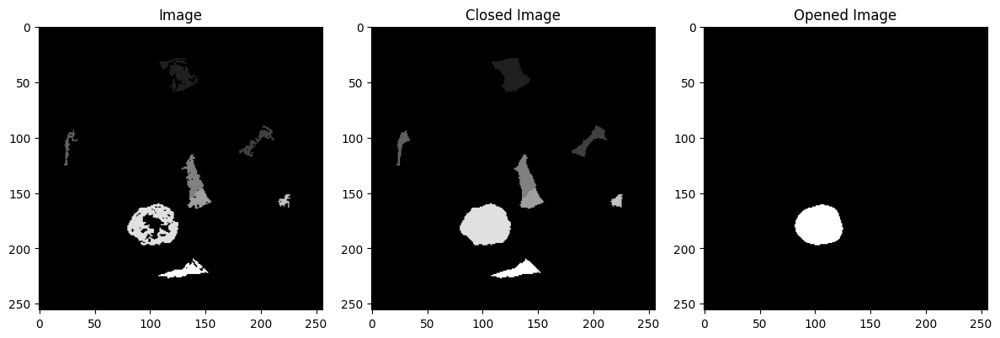

In [ ]:
print(segmented_image.shape)
closed_image = morphology.closing(segmented_image, morphology.disk(6))
opened_image = morphology.opening(closed_image, morphology.disk(10))

# Display the original and segmented images
MediaPlayer.display_images([segmented_image, closed_image, opened_image], ["Image","Closed Image","Opened Image"])

# 4. Run the pipeline

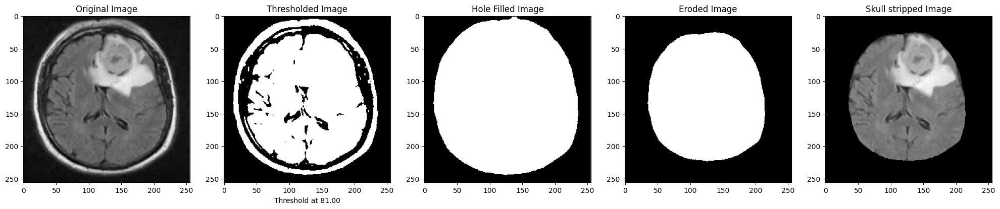

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


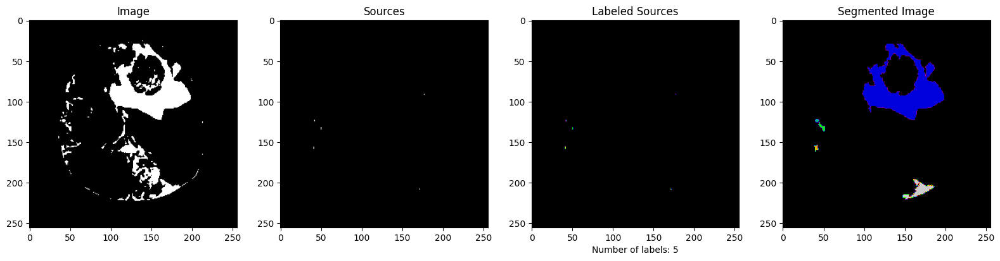

[False  True]


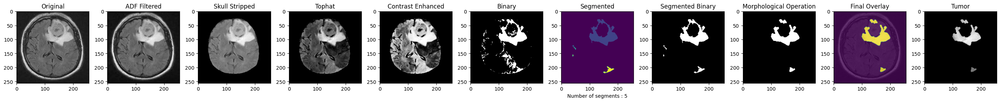

10.370266199111938

In [ ]:
def run_pipeline(image, parameters):
    start_time = time.time()

    # 2. Preprocessing
    # a. ADF filtering

    adf_image = anisotropic_diffusion_filter(image, parameters['adf']['alpha'], parameters['adf']['beta'], parameters['adf']['iterations'])

    # b. Skull stripping
    skull_stripped_image = skull_stripping(adf_image,
                                       se_closing=parameters['skull_stripping']['se_closing'],
                                        #skull_remove_area=skull_remove_area,
                                       se_erosion=parameters['skull_stripping']['se_erosion'],
                                        show_pipeline=True)

    # c.
    tophat_image = morphology.white_tophat(skull_stripped_image, parameters['se_tophat'])

    # d. Contrast enhancement
    contrasted_image = contrast_enhancement(tophat_image)

    # 3. Segmentation
    # a. Watershed segmentation
    binary_image, thresh = get_binary(contrasted_image, parameters['binary_thresh'])

    segmented_image, nbr_segments = watershed_segmentation(binary_image, parameters['se_peak_local'], show_pipeline=True)
    segmented_image_binary = segmented_image > 0

    # b. Morphological operations
    closed_image = morphology.closing(segmented_image_binary, parameters['final_morph_operation']['se_closing'])
    opened_image = morphology.opening(closed_image, parameters['final_morph_operation']['se_opening'])

    print(np.unique(opened_image))
    tumor_image = np.where(opened_image, image, 0)

    execution_time = time.time() - start_time

    # Affichage des résultats
    fig, axs = plt.subplots(1, 11, figsize=(28, 4))  # Modifié pour 9 graphiques
    axs[0].imshow(image, cmap='gray')
    axs[0].set_title('Original')
    axs[1].imshow(adf_image, cmap='gray')
    axs[1].set_title('ADF Filtered')
    axs[2].imshow(skull_stripped_image, cmap='gray')
    axs[2].set_title('Skull Stripped')
    axs[3].imshow(tophat_image, cmap='gray')
    axs[3].set_title('Tophat')
    axs[4].imshow(contrasted_image, cmap='gray')  # Ajout de l'image contrastée
    axs[4].set_title('Contrast Enhanced')
    axs[5].imshow(binary_image, cmap='gray')
    axs[5].set_title('Binary')
    axs[6].imshow(segmented_image, cmap='viridis')
    axs[6].set_xlabel(f'Number of segments : {nbr_segments}')
    axs[6].set_title('Segmented')
    axs[7].imshow(segmented_image_binary, cmap='gray')
    axs[7].set_title('Segmented Binary')
    #axs[8].imshow(closed_image, cmap='gray')
    #axs[8].set_title('Closed')
    axs[8].imshow(opened_image, cmap='gray')
    axs[8].set_title('Morphological Operation')
    axs[9].imshow(image, cmap='gray')
    axs[9].imshow(opened_image, cmap='viridis', alpha=0.75)  # Alpha réglé pour la transparence
    axs[9].set_title('Final Overlay')
    axs[10].imshow(tumor_image, cmap='gray')
    axs[10].set_title('Tumor')

    plt.tight_layout()  # Pour ajuster la disposition
    plt.show()

    return tumor_image, execution_time


dict_parameters = {
    'A': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(2), 'se_erosion':morphology.disk(16)},
        'se_tophat': morphology.disk(25),
        'binary_thresh' : 220,
        'se_peak_local': morphology.disk(50),
        'final_morph_operation': {'se_closing': morphology.disk(5), 'se_opening':morphology.disk(10)}
    },
    'B': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(2), 'se_erosion':morphology.disk(26)},
        'se_tophat': morphology.disk(17),
        'binary_thresh' : 230,
        'se_peak_local': morphology.disk(30),
        'final_morph_operation': {'se_closing': None, 'se_opening':morphology.disk(9)}
    },
    'C': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(5), 'se_erosion':morphology.disk(21)},
        'se_tophat': morphology.disk(25),
        'binary_thresh' : 205,
        'se_peak_local': morphology.disk(60),
        'final_morph_operation': {'se_closing': morphology.disk(1), 'se_opening':morphology.disk(3)}
    },
    'D': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(5), 'se_erosion':morphology.disk(17)},
        'se_tophat': morphology.disk(45),
        'binary_thresh' : 220,
        'se_peak_local': morphology.disk(40),
        'final_morph_operation': {'se_closing': morphology.disk(5), 'se_opening':morphology.disk(5)}
    },
    'E': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(6), 'se_erosion':morphology.disk(16)},
        'se_tophat': morphology.disk(13),
        'binary_thresh' : 220,
        'se_peak_local': morphology.disk(40),
        'final_morph_operation': {'se_closing': None, 'se_opening':morphology.disk(8)}
    },
    'F': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(10), 'se_erosion':morphology.disk(20)},
        'se_tophat': morphology.disk(50),
        'binary_thresh' : 200,
        'se_peak_local': morphology.disk(40),
        'final_morph_operation': {'se_closing': None, 'se_opening':morphology.disk(4)}
    },
    'G': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(10), 'se_erosion':morphology.disk(13)},
        'se_tophat': morphology.disk(45),
        'binary_thresh' : 200,
        'se_peak_local': morphology.disk(40),
        'final_morph_operation': {'se_closing': None, 'se_opening':morphology.disk(5)}
    },
    'H': {
        'adf': {'alpha':0.1, 'beta':0.1, 'iterations':3},
        'skull_stripping': {'se_closing': morphology.disk(5), 'se_erosion':morphology.disk(19)},
        'se_tophat': morphology.disk(13),
        'binary_thresh' : 220,
        'se_peak_local': morphology.disk(50),
        'final_morph_operation': {'se_closing': None, 'se_opening':morphology.disk(9)}
    }
}


# Exécution de la pipeline sur les images
img = images[2]
tumor_image, execution_time = run_pipeline(img, dict_parameters['C'])
execution_time

## 5. Analyse des Performances

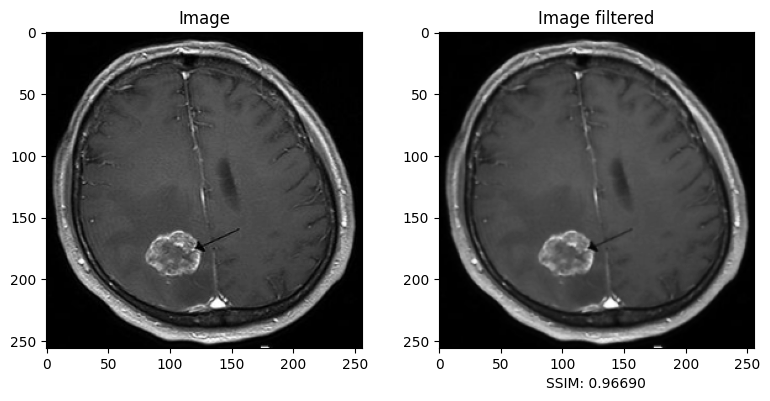

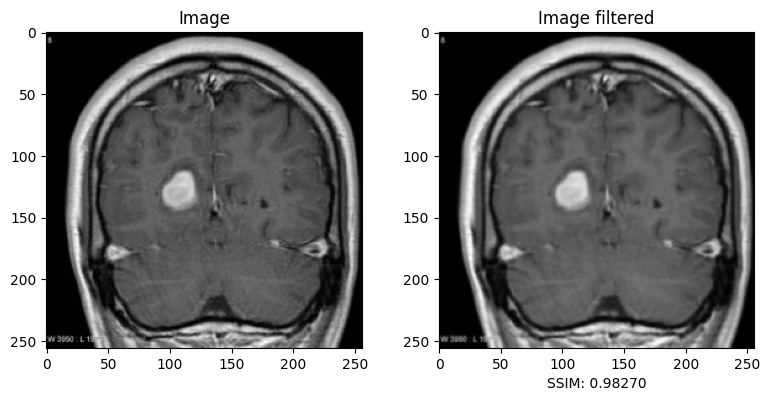

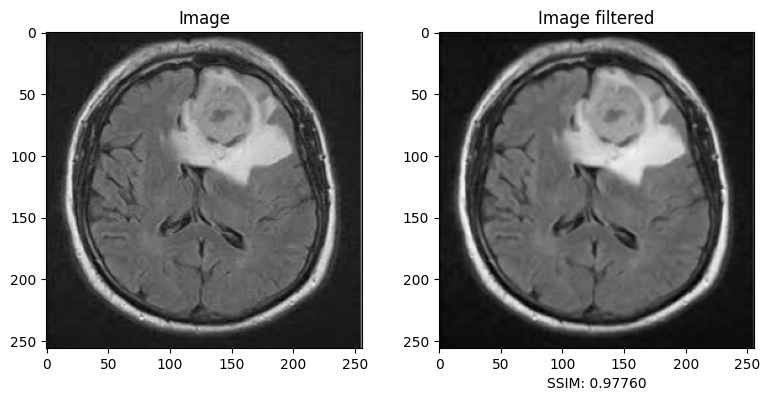

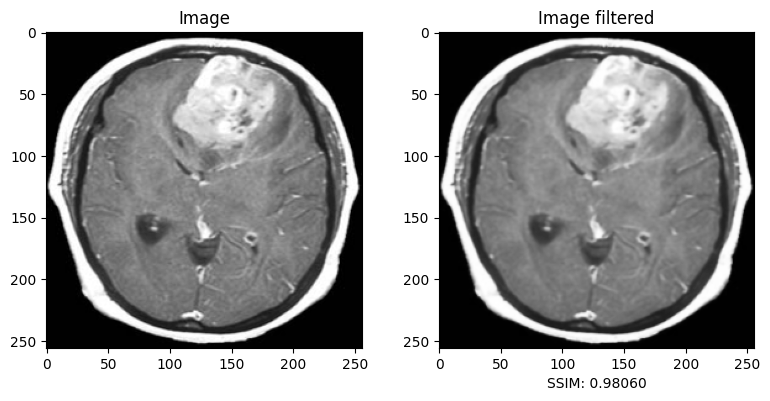

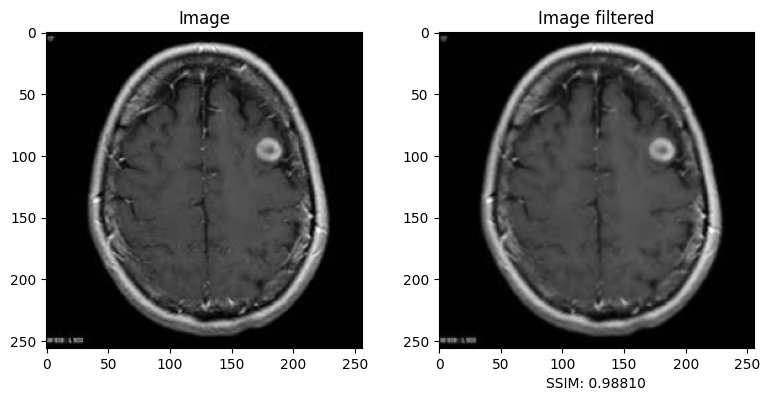

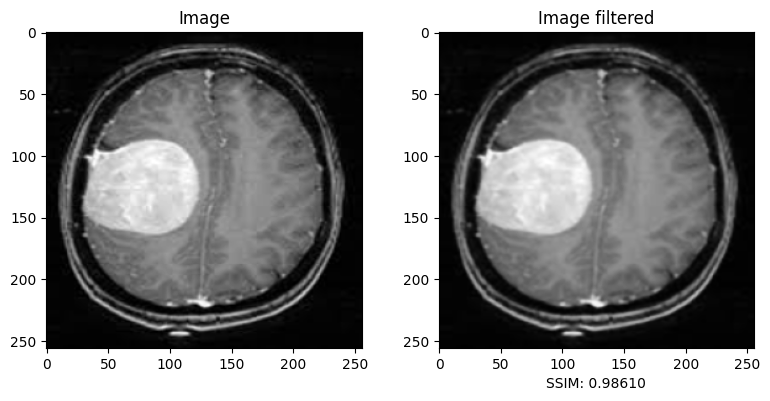

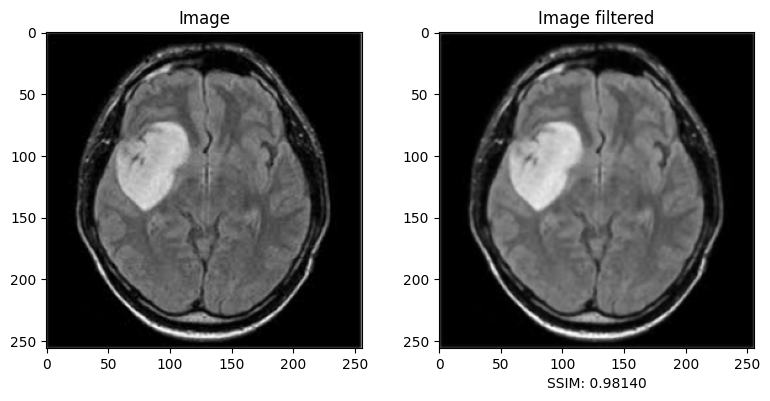

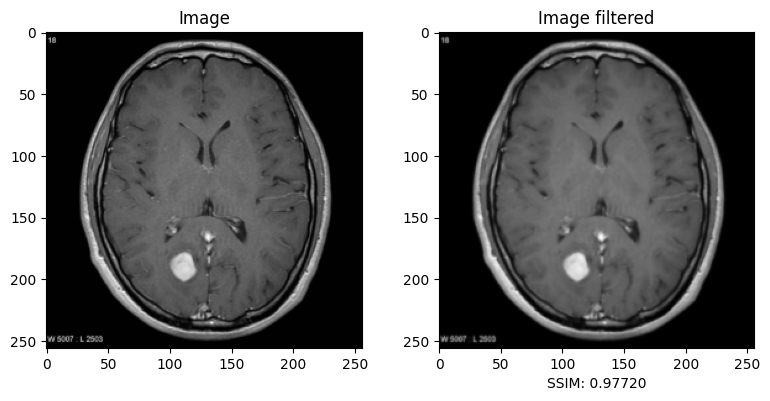

In [ ]:
# Dictionnaire pour stocker les résultats SSIM
ssim_results = {'Image': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H'], 'SSIM': []}

for i, image in enumerate(images):
    image_filtered = anisotropic_diffusion_filter(image, alpha, beta, iterations)
    score_value = round(ssim(image, image_filtered),4)

    MediaPlayer.display_images([image, image_filtered], ["Image", "Image filtered"], ["", f'SSIM: {score_value:.5f}'])

    # Ajouter les résultats au dictionnaire
    ssim_results['SSIM'].append(score_value)

ssim_df = pd.DataFrame(ssim_results)
ssim_df.to_csv('ssim_results.csv', index=False)

In [ ]:
def calculate_image_features(image, reference_image):
    # Assurez-vous que l'image est en niveaux de gris
    if image.ndim == 3:
        image = color.rgb2gray(image)

    # Convertissez l'image en flottant pour les calculs
    image = img_as_ubyte(image)

    # Calcul des caractéristiques
    mean_value = np.mean(image)
    entropy_value = shannon_entropy(image)

    # RMS et Smoothness
    rms_value = np.sqrt(np.mean(np.square(image - mean_value)))
    smoothness_value = 1 - 1 / (1 + rms_value**2)

    # GLCM
    # GLCM with standard distances and angles
    #angles=[0, np.pi/4, np.pi/2, 3*np.pi/4]
    glcm = greycomatrix(image, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    contrast_value = greycoprops(glcm, 'contrast').mean()
    correlation_value = greycoprops(glcm, 'correlation').mean()
    energy_value = greycoprops(glcm, 'energy').mean()
    homogeneity_value = greycoprops(glcm, 'homogeneity').mean()

    # Le PSNR nécessite une image de référence et une image segmentée
    psnr_value = metrics.peak_signal_noise_ratio(reference_image, image)

    features_computed = {
        'Mean': mean_value,
        'Entropy': entropy_value,
        'Smoothness': smoothness_value,
        'RMS': rms_value,
        'PSNR': psnr_value,
        'Contrast': contrast_value,
        'Correlation': correlation_value,
        'Energy': energy_value,
        'Homogeneity': homogeneity_value
    }

    return features_computed

# Exemple d'utilisation
# Remplacer 'segmented_image' par votre image segmentée
features_computed = calculate_image_features(tumor_image, img)
for feature_name, value in features_computed.items():
    print(f"{feature_name}: {value}")

Mean: 10.145523071289062
Entropy: 0.694203774146225
Smoothness: 0.9994133598861559
RMS: 41.27496343553872
PSNR: 9.455933068327276
Contrast: 116.91709558823528
Correlation: 0.9658116802980091
Energy: 0.9388198243159187
Homogeneity: 0.9532281225013458


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

loop for all images

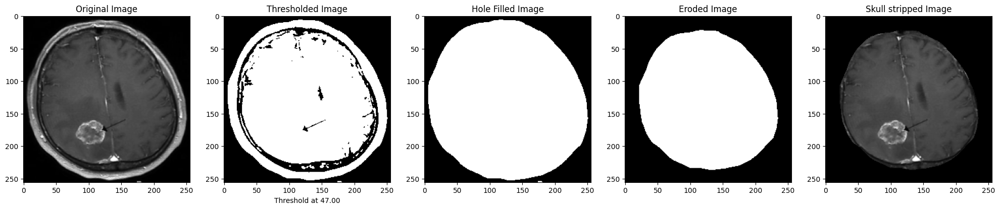

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


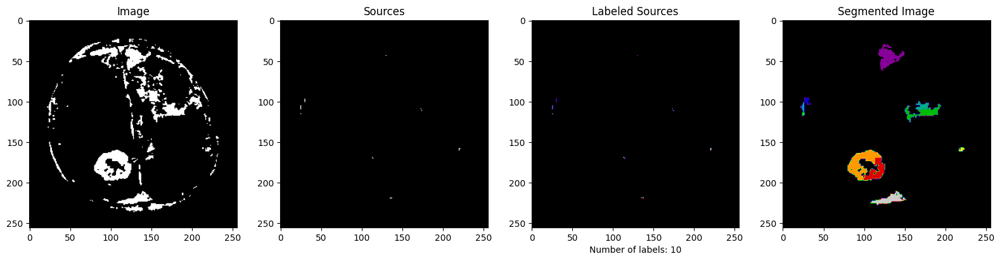

[False  True]


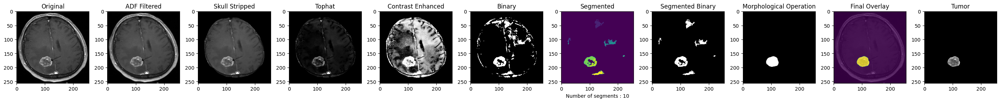

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

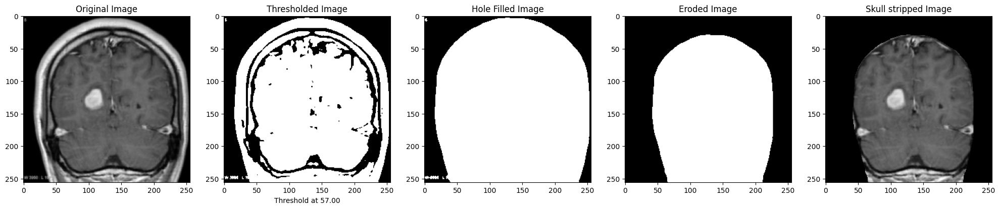

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


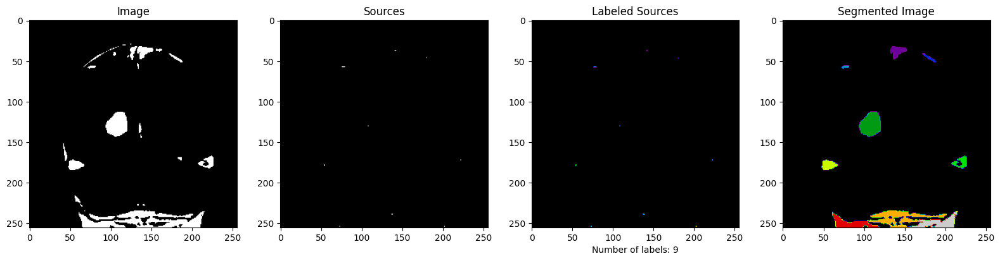

[False  True]


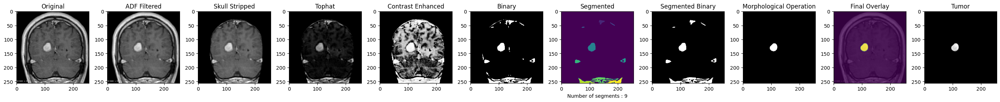

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

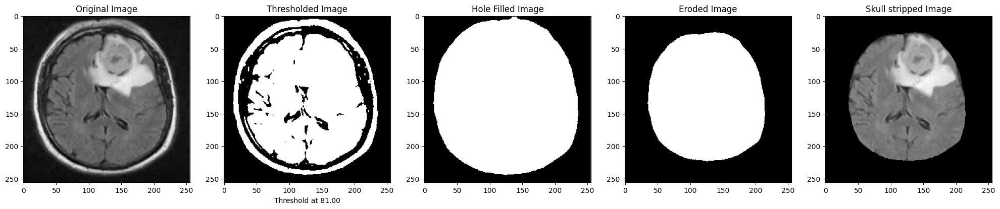

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


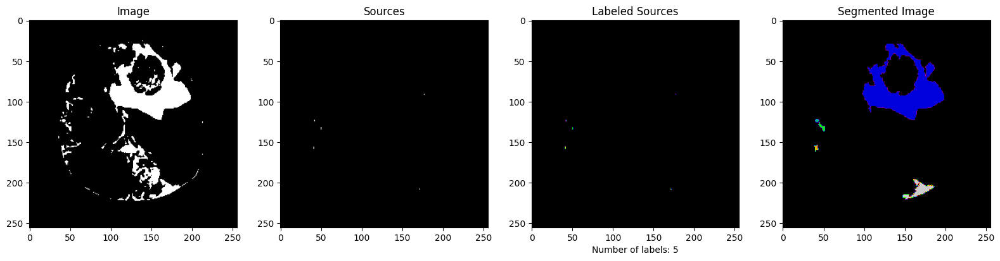

[False  True]


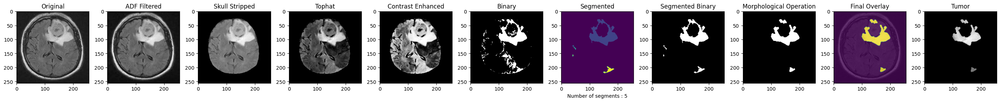

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

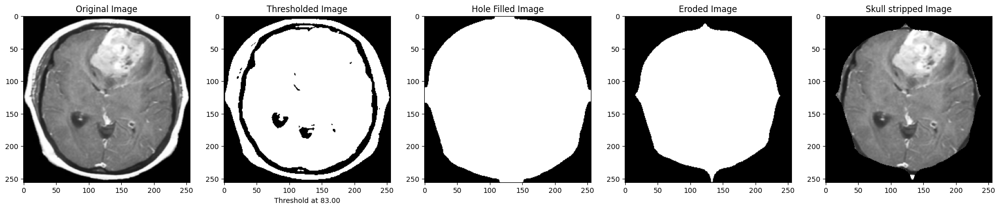

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


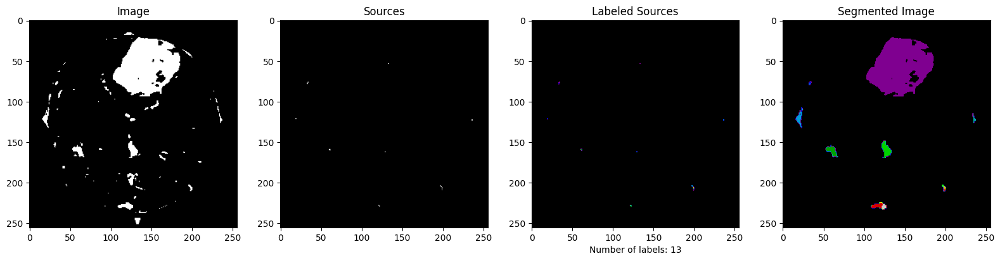

[False  True]


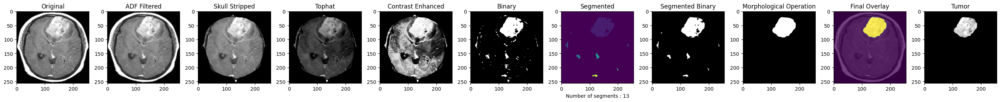

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

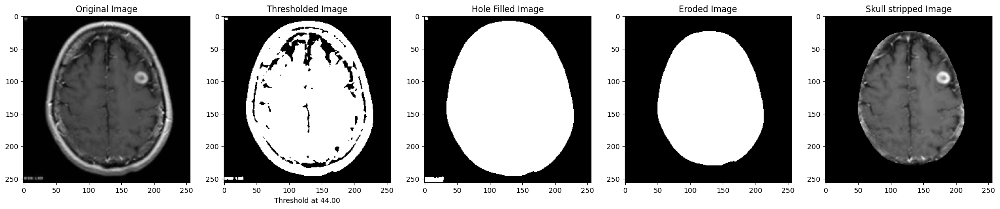

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


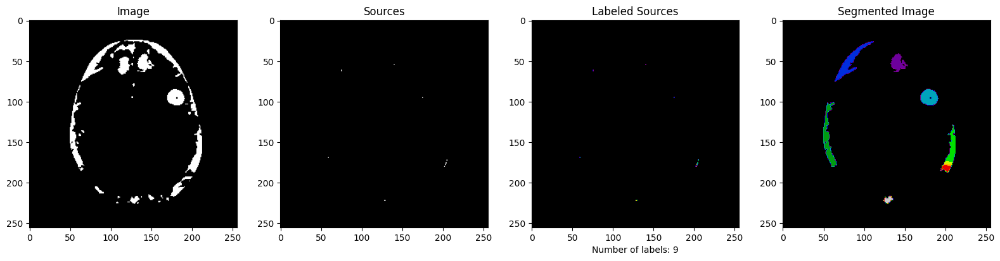

[False  True]


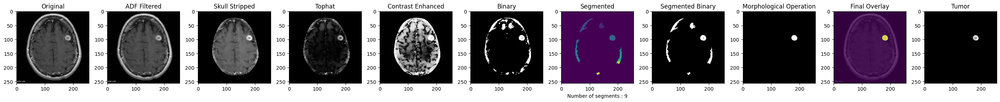

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

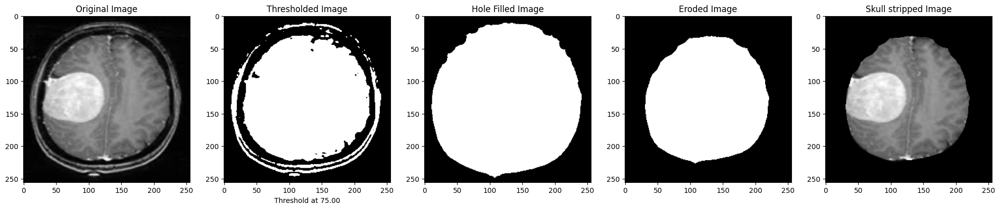

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


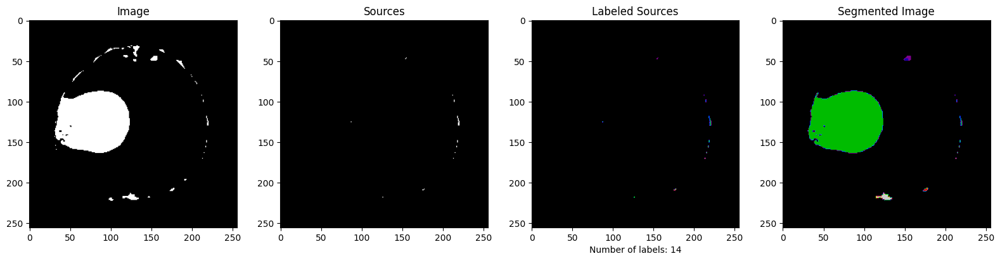

[False  True]


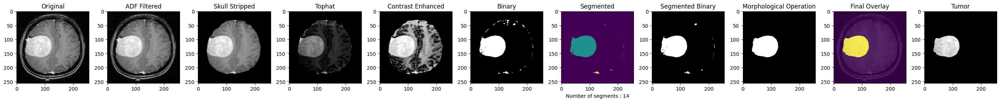

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

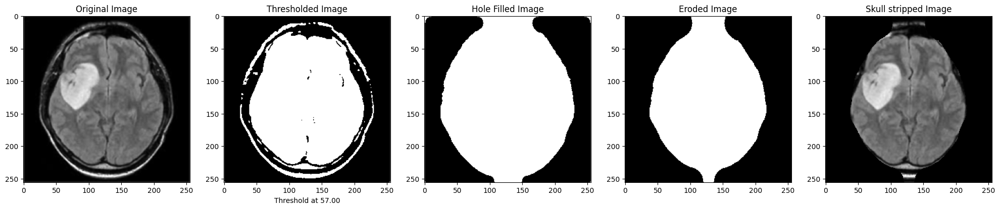

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


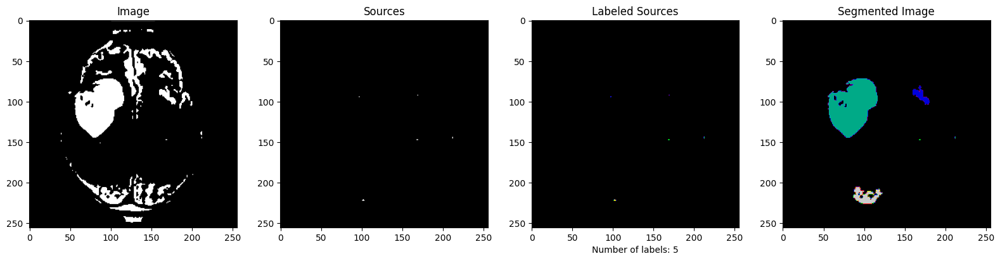

[False  True]


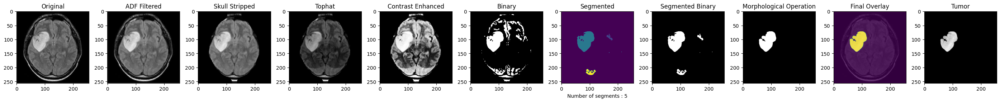

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

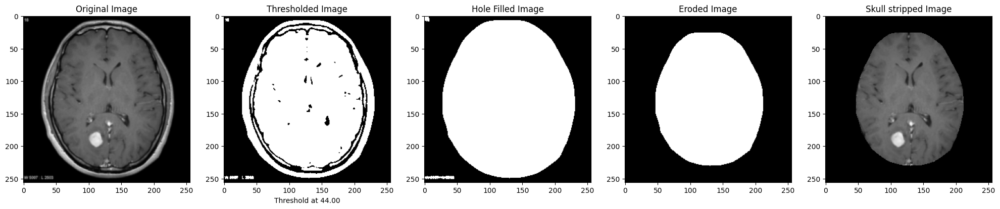

<ipython-input-13-27167a14e33c>:36: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = feature.peak_local_max(distance, indices=False, footprint=se_peak_local, labels=image)


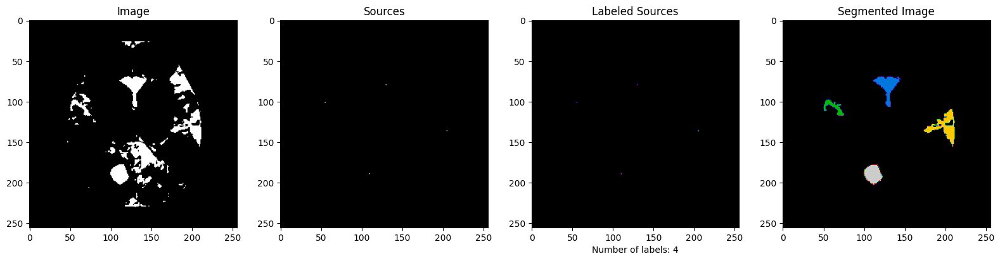

[False  True]


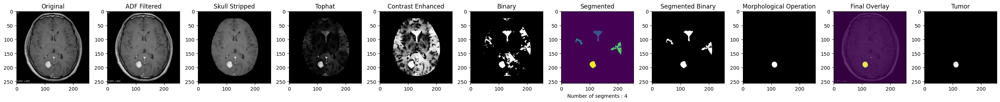

  Image       Mean   Entropy  Smoothness        RMS       PSNR    Contrast  \
0     A   2.308182  0.271947    0.996645  17.235126  10.907223   27.108762   
1     B   1.537796  0.120649    0.996355  16.533778   9.269145   22.549969   
2     C  10.145523  0.694204    0.999413  41.274963   9.455933  116.917096   
3     D  13.551727  0.755716    0.999637  52.471706   6.597104   86.478676   
4     E   0.715515  0.075519    0.990758  10.353986  11.923701    9.480423   
5     F  18.627823  0.948693    0.999729  60.734482  10.033213   87.890196   
6     G   7.757935  0.516526    0.999267  36.917711  11.321755   58.281771   
7     H   0.841614  0.071095    0.993229  12.111128  12.062974   15.506648   

   Correlation    Energy  Homogeneity  Execution Time  
0     0.954545  0.980040     0.981673        5.257160  
1     0.958915  0.990886     0.992697        4.829783  
2     0.965812  0.938820     0.953228        6.864071  
3     0.984353  0.935097     0.946553       16.817475  
4     0.955956  0

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

In [ ]:
# Dictionnaire pour stocker les résultats des caractéristiques
features_results = {
    'Image': [],
    'Mean': [],
    'Entropy': [],
    'Smoothness': [],
    'RMS': [],
    'PSNR': [],
    'Contrast': [],
    'Correlation': [],
    'Energy': [],
    'Homogeneity': [],
    'Execution Time': []
}

for image, (image_name, parameters) in zip(images, dict_parameters.items()):
    # Segmentation
    tumor_image, execution_time = run_pipelineimage, parameters)

    # Calculez les caractéristiques pour chaque image
    features_computed = calculate_image_features(tumor_image, image)

    # Ajoutez les résultats au dictionnaire
    features_results['Image'].append(image_name)
    for key, value in features_computed.items():
        features_results[key].append(value)
    features_results['Execution Time'].append(execution_time)


# Créez un DataFrame à partir du dictionnaire
features_df = pd.DataFrame(features_results)

# Exportez le DataFrame en CSV
features_df.to_csv('image_features.csv', index=False)

# Affichez le DataFrame pour vérification
print(features_df)

# Gray Level Co-occurrence Matrix (GLCM)

GLCM :
- http://lapi.fi-p.unam.mx/wp-content/uploads/Tutorial-GLCM.pdf
- https://www.youtube.com/watch?v=cq0Br3zB2AU&ab_channel=AdrienFoucart
- http://www.cyto.purdue.edu/cdroms/micro2/content/education/wirth06.pdf

$$C_{\Delta x, \Delta y}(i,j) = \sum_{x=0}^{n-1} \sum_{y=0}^{m-1}
\begin{cases} 1, & \text{if }I(x, y)=i\text{ and }I(x+\Delta x, y+\Delta y)=j \\
0, & \text{otherwise}\end{cases}$$

If $C_{5,10}(200,20) = N$, it means that, in the image, there are $N$ occurrences of a pixel with a value of 200 and a pixel with a value of 20 such that their position are $(x,y)$ and $(x+5,y+10)$.

In [ ]:
def extract_patches(image, locations, patch_size):
    patches = []
    # Extraction des patches
    for loc in locations:
        patch = image[loc[0]:loc[0] + patch_size, loc[1]:loc[1] + patch_size]
        patches.append(patch)
    return patches

In [ ]:
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
from matplotlib.patches import Rectangle

def display_glcm_properties(image, first_locations, second_locations, patch_size, labels):
    """
    Calcule et affiche les propriétés GLCM de chaque patch avec bounding boxes.

    :param image: Image à partir de laquelle les patches sont extraits.
    :param first_locations: Emplacements du premier ensemble de patches.
    :param second_locations: Emplacements du deuxième ensemble de patches.
    :param patch_size: Taille des patches.
    :param labels: Étiquettes pour les ensembles de patches.
    :return: Deux listes contenant les valeurs de dissimilarité et de corrélation pour chaque patch.
    """
    xs = []  # Dissimilarité
    ys = []  # Corrélation

    first_patches = extract_patches(image, first_locations, patch_size)
    second_patches = extract_patches(image, second_locations, patch_size)

    # Calcul des propriétés GLCM pour chaque patch
    for patch in first_patches + second_patches:
        glcm = graycomatrix(patch, distances=[5], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4], levels=256, symmetric=True)
        xs.append(graycoprops(glcm, 'dissimilarity')[0, 0])
        ys.append(graycoprops(glcm, 'correlation')[0, 0])

    # Création de la figure
    fig = plt.figure(figsize=(8, 8))
    print('Grey level co-occurrence matrix features')

    # Affichage de l'image originale avec les emplacements des patches
    ax1 = fig.add_subplot(3, 2, 1)
    ax1.imshow(image, cmap=plt.cm.gray, vmin=0, vmax=255)
    for (y, x) in first_locations:
        rect = Rectangle((x, y), patch_size, patch_size, linewidth=1, edgecolor='g', facecolor='none')
        ax1.add_patch(rect)
    for (y, x) in second_locations:
        rect = Rectangle((x, y), patch_size, patch_size, linewidth=1, edgecolor='r', facecolor='none')
        ax1.add_patch(rect)
    ax1.set_title('Original Image')
    ax1.set_xlabel(f'with {len(first_patches + second_patches)} patches')
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.axis('image')

    # Affichage des propriétés GLCM pour chaque patch
    ax2 = fig.add_subplot(3, 2, 2)
    ax2.plot(xs[:len(first_patches)], ys[:len(first_patches)], 'go', label=labels[0])
    ax2.plot(xs[len(first_patches):], ys[len(first_patches):len(first_patches) + len(second_patches)], 'ro', label=labels[1])
    ax2.set_title('GLCM properties each patch')
    ax2.set_xlabel('GLCM Dissimilarity')
    ax2.set_ylabel('GLCM Correlation')
    ax2.legend()

    plt.tight_layout()
    plt.show()

Grey level co-occurrence matrix features


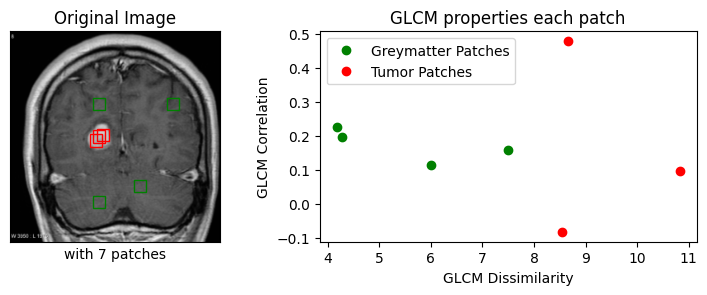

In [ ]:
PATCH_SIZE = 15

# open the camera image
image = images[1]

# select some patches from grassy areas of the image
greymatter_locations = [(80, 100), (80, 190), (200, 100), (180, 150)]
greymatter_patches = extract_patches(image, greymatter_locations, PATCH_SIZE)

# select some patches from sky areas of the image
tumor_locations = [(118, 105), (120, 100), (125, 97)]
tumor_patches = extract_patches(image, tumor_locations, PATCH_SIZE)

# Assurez-vous que les variables image, greymatter_locations, tumor_locations, PATCH_SIZE et labels sont définies
display_glcm_properties(image,
                        first_locations=greymatter_locations,
                        second_locations=tumor_locations,
                        patch_size=PATCH_SIZE,
                        labels=['Greymatter Patches', 'Tumor Patches'])


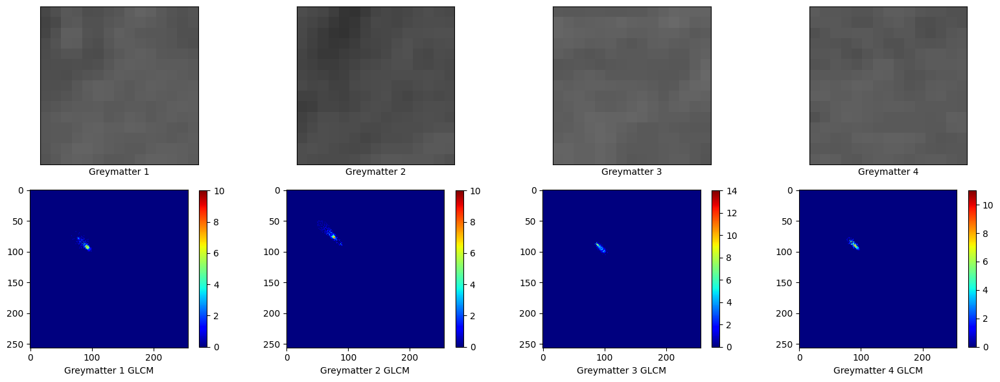

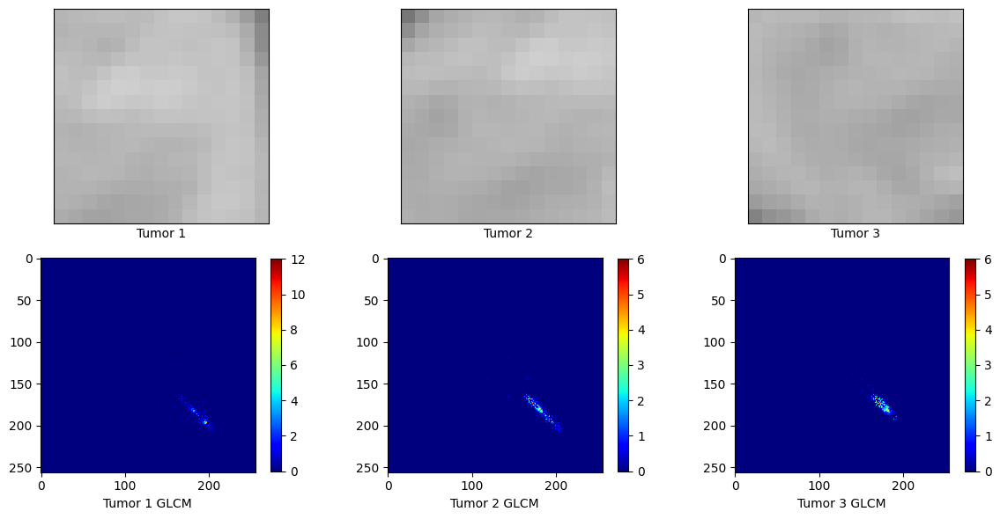

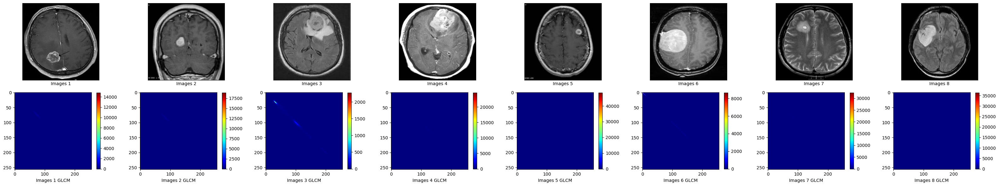

In [ ]:
def log_nz(M):
    """
    Applique la fonction logarithme à une matrice, en remplaçant les zéros par une petite valeur non nulle avant le logarithme.

    :param M: Matrice d'entrée.
    :return: Matrice après application du logarithme.
    """
    M2 = np.where(M == 0, 0.5, M)  # Remplace les 0 par 0.5
    return np.log(M2)

def display_patches_and_glcm(patches, title_prefix):
    """
    Affiche chaque patch et sa matrice GLCM après application du logarithme.

    :param patches: Liste de patches à afficher.
    :param title_prefix: Préfixe pour le titre de chaque patch.
    """
    # Largeur fixe pour chaque patch et sa GLCM
    width_per_patch = 4  # Vous pouvez ajuster cette valeur en fonction de vos besoins

    # Création de la figure avec une largeur dynamique
    fig = plt.figure(figsize=(len(patches) * width_per_patch, 6))

    for i, patch in enumerate(patches):
        # Affichage du patch
        ax_patch = fig.add_subplot(2, len(patches), i + 1)
        ax_patch.imshow(patch, cmap=plt.cm.gray, vmin=0, vmax=255)
        ax_patch.set_xlabel(f"{title_prefix} {i + 1}")
        ax_patch.set_xticks([])
        ax_patch.set_yticks([])

        # Calcul et affichage de la GLCM
        glcm = graycomatrix(patch, distances=[1], angles=[0], levels=256, symmetric=True)
        glcm = glcm[:, :, 0, 0]
        ax_glcm = fig.add_subplot(2, len(patches), len(patches) + i + 1)
        im = ax_glcm.imshow(glcm, cmap=plt.cm.jet)
        ax_glcm.set_xlabel(f"{title_prefix} {i + 1} GLCM")
        fig.colorbar(im, ax=ax_glcm, shrink=0.99)

    plt.tight_layout()
    plt.show()

# Assurez-vous que les listes greymatter_patches et tumor_patches sont définies
display_patches_and_glcm(greymatter_patches, "Greymatter")
display_patches_and_glcm(tumor_patches, "Tumor")
display_patches_and_glcm(images, "Images")